In [9]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/synthetic-asl-alphabet/alphabet.jpg
/kaggle/input/synthetic-asl-alphabet/Test_Alphabet/N/f0c0975d-1ac0-4800-a1e0-7aa7a9c4d0b2.rgb_0000.png
/kaggle/input/synthetic-asl-alphabet/Test_Alphabet/N/3d6878fa-518f-4f5c-81bc-d41449616902.rgb_0000.png
/kaggle/input/synthetic-asl-alphabet/Test_Alphabet/N/5d89736e-136a-4d58-9ab7-58955ce1f0bc.rgb_0000.png
/kaggle/input/synthetic-asl-alphabet/Test_Alphabet/N/da72ee89-0519-4f48-b016-46ff5fc73d9d.rgb_0000.png
/kaggle/input/synthetic-asl-alphabet/Test_Alphabet/N/bd113b66-e024-448a-badc-cb339abf8172.rgb_0000.png
/kaggle/input/synthetic-asl-alphabet/Test_Alphabet/N/ae8724c5-56e4-4f53-8490-c9a9608f645f.rgb_0000.png
/kaggle/input/synthetic-asl-alphabet/Test_Alphabet/N/f985370d-8e2e-4302-b54f-b71dfa26a527.rgb_0000.png
/kaggle/input/synthetic-asl-alphabet/Test_Alphabet/N/357e5653-0d18-4450-a792-32b56d2ca2f0.rgb_0000.png
/kaggle/input/synthetic-asl-alphabet/Test_Alphabet/N/9c78e8c0-9cb9-44d5-ac6c-db07a66f28f8.rgb_0000.png
/kaggle/input/synthetic

Found 24300 images belonging to 27 classes.
Found 2700 images belonging to 27 classes.


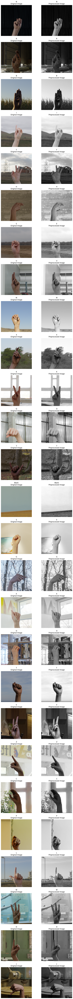

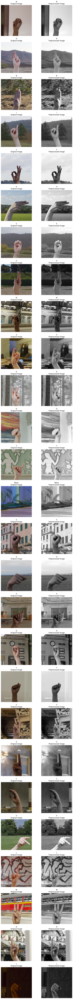

In [10]:
import os
import matplotlib.pyplot as plt
import cv2
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Specify the color mode for the generators
color_mode = 'grayscale'  # You can change this to 'rgb' if needed

# Define the paths to the training and test data directories
train_data_dir = '/kaggle/input/synthetic-asl-alphabet/Train_Alphabet'
test_data_dir = '/kaggle/input/synthetic-asl-alphabet/Test_Alphabet'

# Create an ImageDataGenerator for training data with the specified color mode
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize pixel values
)

# Create an ImageDataGenerator for test/validation data with the specified color mode
test_datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize pixel values
)

# Define the batch size and target size for resizing
batch_size = 32
target_size = (256, 256)  # Specify the target size here

# Create data generators for training and test data with target_size and the specified color mode
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    batch_size=batch_size,
    class_mode='sparse',  # Specify class mode depending on your dataset
    target_size=target_size,  # Specify the target size here
    color_mode=color_mode  # Specify color mode
)

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    batch_size=batch_size,
    class_mode='sparse',  # Specify class mode depending on your dataset
    target_size=target_size,  # Specify the target size here
    color_mode=color_mode  # Specify color mode
)

def display_preprocessed_images(data_dir, color_mode, target_size=(256, 256)):
    # Set up subplots with one column and multiple rows
    class_folders = os.listdir(data_dir)
    num_classes = len(class_folders)
    fig, axes = plt.subplots(num_classes, 2, figsize=(10, 5 * num_classes))

    # Iterate over each class folder, display one original and one preprocessed image from each class
    for i, class_folder in enumerate(class_folders):
        class_path = os.path.join(data_dir, class_folder)
        image_files = os.listdir(class_path)
        image_path = os.path.join(class_path, image_files[0])  # Assuming at least one image is present in each class

        # Read the original image
        original_image = plt.imread(image_path)

        # Display the original image
        axes[i, 0].imshow(original_image, cmap='gray' if color_mode == 'grayscale' else 'rgb')
        axes[i, 0].set_title(f"{class_folder}\nOriginal Image")
        axes[i, 0].axis('off')

        # Preprocess the image
        image_preprocessed = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read the image as grayscale
        image_preprocessed = image_preprocessed / 255.0

        # Display the preprocessed image
        axes[i, 1].imshow(image_preprocessed, cmap='gray')
        axes[i, 1].set_title(f"{class_folder}\nPreprocessed Image")
        axes[i, 1].axis('off')

    plt.show()

# Display original and preprocessed images for both train and test data
display_preprocessed_images(train_data_dir, color_mode)
display_preprocessed_images(test_data_dir, color_mode)


In [11]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Define the CNN model
model = models.Sequential()

# Convolutional layers
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(256, 256, 1)))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(512, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# Flatten layer to transition from convolutional to dense layers
model.add(layers.Flatten())

# Dense layers
model.add(layers.Dense(512, activation='relu'))
model.add(layers.BatchNormalization())  # Batch Normalization

# Regularization - Dropout
model.add(layers.Dropout(0.5))

# Output layer
num_classes = 27  # Assuming 27 classes
model.add(layers.Dense(num_classes, activation='softmax', kernel_regularizer=tf.keras.regularizers.l2(0.01)))  # Regularization - L2

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Display the model summary
model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 254, 254, 32)      320       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 127, 127, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 62, 62, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_10 (Conv2D)          (None, 60, 60, 128)       73856     
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 30, 30, 128)      

Number of training samples: 24300
Number of test samples: 2700
Epoch 1/10
759/759 [==============================] - 2489s 3s/step - loss: 1.6948 - accuracy: 0.6450 - val_loss: 0.5603 - val_accuracy: 0.9470
Epoch 2/10
759/759 [==============================] - 2476s 3s/step - loss: 0.4525 - accuracy: 0.9628 - val_loss: 0.3088 - val_accuracy: 0.9852
Epoch 3/10
759/759 [==============================] - 2495s 3s/step - loss: 0.2799 - accuracy: 0.9918 - val_loss: 0.2340 - val_accuracy: 0.9926
Epoch 4/10
759/759 [==============================] - 2546s 3s/step - loss: 0.2155 - accuracy: 0.9980 - val_loss: 0.1917 - val_accuracy: 0.9948
Epoch 5/10
759/759 [==============================] - 2495s 3s/step - loss: 0.1766 - accuracy: 0.9995 - val_loss: 0.1617 - val_accuracy: 0.9981
Epoch 6/10
759/759 [==============================] - 2436s 3s/step - loss: 0.1487 - accuracy: 0.9998 - val_loss: 0.1326 - val_accuracy: 0.9974
Epoch 7/10
759/759 [==============================] - 2448s 3s/step - los

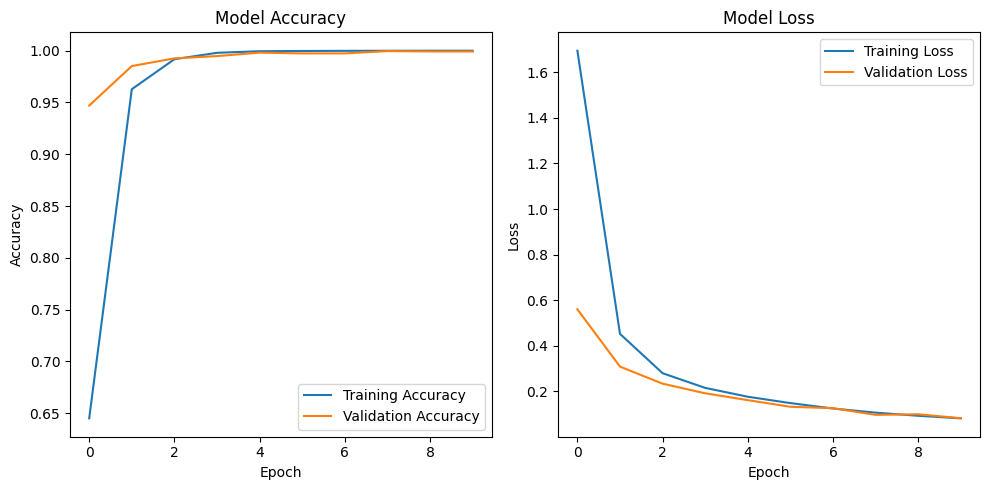

In [12]:
# Assuming you want to train for 10 epochs
epochs = 10

# Debugging information
print(f"Number of training samples: {train_generator.samples}")
print(f"Number of test samples: {test_generator.samples}")

# Early Stop
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,  # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True
)

# Train the model using the generators
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=epochs,
    validation_data=test_generator,
    callbacks=[early_stopping]  # Include early stopping callback
)
# Evaluate the model on the test set using the test generator
test_loss, test_acc = model.evaluate(test_generator)
print(f'Test Accuracy: {test_acc}')

# Plot training history
plt.figure(figsize=(10, 5))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Save the model in the native Keras format
model.save('/kaggle/working/asl_cnn_model.keras')


1/1 [==============================] - 1s 877ms/step


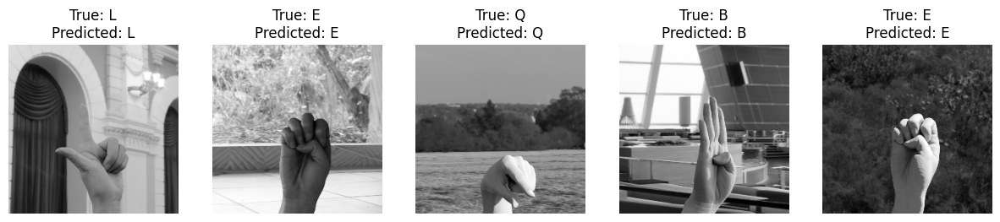

In [37]:
def plot_images_with_predictions(test_generator, model, train_generator, num_images=5):
    # Retrieve the class names
    class_names = list(train_generator.class_indices.keys())
    class_indices = train_generator.class_indices

    # Invert the class_indices dictionary to map indices to class names
    index_to_class = {v: k for k, v in class_indices.items()}

    # Get a batch of images and labels from the test generator
    test_images, test_labels = next(test_generator)

    # Make predictions
    predictions = model.predict(test_images)
    predicted_labels = np.argmax(predictions, axis=1)

    # Plot the images and their labels
    plt.figure(figsize=(15, 5))
    for i in range(num_images):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(test_images[i].reshape(256, 256), cmap='gray')
        true_label = index_to_class[test_labels[i]]
        predicted_label = index_to_class[predicted_labels[i]]
        plt.title(f"True: {true_label}\nPredicted: {predicted_label}")
        plt.axis('off')
    plt.show()

# Call the function to plot images with their true and predicted labels
plot_images_with_predictions(test_generator, model, train_generator, num_images=5)
